In [1]:
# Importing the requisite packages
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import pysal
import splot

In [2]:
# Reading in the data
path = r'G:\My Drive\Geospatial Data Science with Python\Data\NY Airbnb June 2020\\'

listings = pd.read_csv(path + 'listings.csv.gz', compression='gzip')

C:\Users\ImDav\AppData\Local\Temp\ipykernel_22108\1828753906.py:4: DtypeWarning: Columns (67) have mixed types. Specify dtype option on import or set low_memory=False.
  listings = pd.read_csv(path + 'listings.csv.gz', compression='gzip')


## Exploratory Data Analysis

In [3]:
print(listings.columns)

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [4]:
# Subsetting the data

listings_sub = listings[['id','property_type','neighbourhood_cleansed', 'neighbourhood_group_cleansed','beds','bathrooms', 'price','latitude','longitude']]

listings_sub.head()

,id,property_type,neighbourhood_cleansed,neighbourhood_group_cleansed,beds,bathrooms,price,latitude,longitude
0,2595,Entire rental unit,Midtown,Manhattan,1.0,NaN,$225.00,40.75356,-73.98559
1,5121,Private room in rental unit,Bedford-Stuyvesant,Brooklyn,1.0,NaN,$60.00,40.68535,-73.95512
2,5136,Entire rental unit,Sunset Park,Brooklyn,2.0,NaN,$275.00,40.66265,-73.99454
3,5178,Private room in rental unit,Midtown,Manhattan,1.0,NaN,$68.00,40.76457,-73.98317
4,5203,Private room in rental unit,Upper West Side,Manhattan,1.0,NaN,$75.00,40.80380,-73.96751


In [5]:
listings_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37410 entries, 0 to 37409
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            37410 non-null  int64  
 1   property_type                 37410 non-null  object 
 2   neighbourhood_cleansed        37410 non-null  object 
 3   neighbourhood_group_cleansed  37410 non-null  object 
 4   beds                          36509 non-null  float64
 5   bathrooms                     0 non-null      float64
 6   price                         37410 non-null  object 
 7   latitude                      37410 non-null  float64
 8   longitude                     37410 non-null  float64
dtypes: float64(4), int64(1), object(4)
memory usage: 2.6+ MB


In [6]:
# Cleaning the data
listings_sub.drop(columns=['beds','bathrooms'], inplace=True)
listings_sub["price"] = listings_sub["price"].replace("[$,]", "", regex=True).astype(float)

C:\Users\ImDav\AppData\Local\Temp\ipykernel_22108\2976864319.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_sub.drop(columns=['beds','bathrooms'], inplace=True)
C:\Users\ImDav\AppData\Local\Temp\ipykernel_22108\2976864319.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings_sub["price"] = listings_sub["price"].replace("[$,]", "", regex=True).astype(float)


In [7]:
listings_sub

,id,property_type,neighbourhood_cleansed,neighbourhood_group_cleansed,price,latitude,longitude
0,2595,Entire rental unit,Midtown,Manhattan,225.0,40.753560,-73.985590
1,5121,Private room in rental unit,Bedford-Stuyvesant,Brooklyn,60.0,40.685350,-73.955120
2,5136,Entire rental unit,Sunset Park,Brooklyn,275.0,40.662650,-73.994540
3,5178,Private room in rental unit,Midtown,Manhattan,68.0,40.764570,-73.983170
4,5203,Private room in rental unit,Upper West Side,Manhattan,75.0,40.803800,-73.967510
...,...,...,...,...,...,...,...
37405,640612171111039003,Entire rental unit,Tompkinsville,Staten Island,144.0,40.631656,-74.094878
37406,640629990855220048,Entire townhouse,Williamsburg,Brooklyn,620.0,40.717840,-73.951610
37407,640658348674867448,Private room in rental unit,Gramercy,Manhattan,93.0,40.735540,-73.987880
37408,641072234133563797,Entire rental unit,East Village,Manhattan,462.0,40.729638,-73.987644


In [8]:
listings_sub['price'].describe()

count    37410.000000
mean       190.775221
std        342.491748
min          0.000000
25%         75.000000
50%        125.000000
75%        203.000000
max      12900.000000
Name: price, dtype: float64

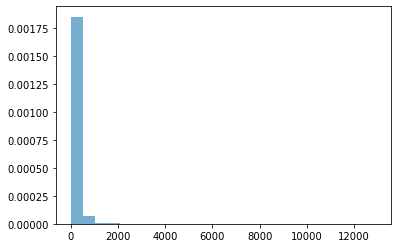

In [9]:
%matplotlib inline
plt.hist(listings_sub['price'], bins=25, density=True, alpha=0.6)
plt.show()

C:\Users\ImDav\anaconda3\envs\Geopy\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


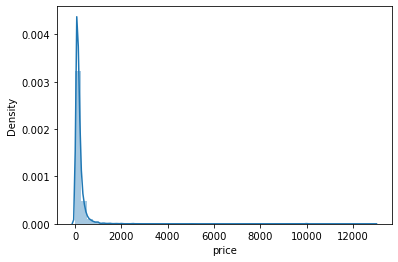

In [10]:
import seaborn as sns
sns.distplot(listings_sub['price'], kde=True)
plt.show()

## Exploratory Spatial Data Analysis

In [11]:
# Convert the pandas dataframe to a geopandas dataframe
listings_sub_gpd = gpd.GeoDataFrame(listings_sub, geometry=gpd.points_from_xy(listings_sub.longitude, listings_sub.latitude, crs=4326))

<GeoAxesSubplot:>

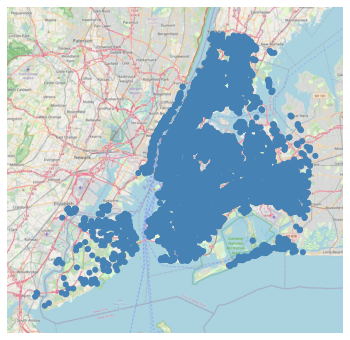

In [12]:
import geoplot.crs as gcrs
import geoplot as gplt
ax = gplt.webmap(listings_sub_gpd,projection=gcrs.WebMercator())
gplt.pointplot(listings_sub_gpd, ax=ax)

In [13]:
# Reading in the New York Census Tracts
NY_tracts_path = "https://www2.census.gov/geo/tiger/TIGER2021/TRACT/tl_2021_36_tract.zip"
NY_Tracts = gpd.read_file(NY_tracts_path)
NY_Tracts = NY_Tracts.to_crs(4326)

# Subsetting the census tracts to those in the New York CBSA
cbsa_path = 'https://www2.census.gov/geo/tiger/TIGER2021/CBSA/tl_2021_us_cbsa.zip'
cbsas = gpd.read_file(cbsa_path)
NY_cbsa = cbsas[cbsas['GEOID']=='35620']

<AxesSubplot:>

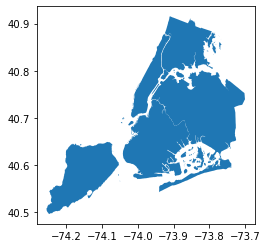

In [14]:
# Borough Boundaries
bpath = r'G:\My Drive\Geospatial Data Science with Python\Data\NYC Boroughs\nybb_22a\\'
Boroughs = gpd.read_file(bpath + 'nybb.shp')
Boroughs = Boroughs.to_crs(4326)
Boroughs.plot()

<GeoAxesSubplot:>

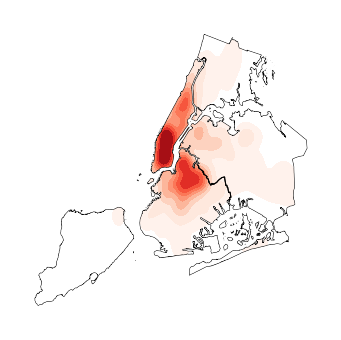

In [15]:
# Creating a heatmap of Airbnb locations

# Creating a heatmap raster from the points
ax = gplt.kdeplot(
    listings_sub_gpd,shade=True, cmap='Reds',
    clip=Boroughs.geometry,
    projection=gcrs.WebMercator())

# Plotting the heatmap on top of the boroughs for context
gplt.polyplot(Boroughs, ax=ax, zorder=1)

In [16]:
# Reading in the New York Census Tracts
NY_tracts_path = "https://www2.census.gov/geo/tiger/TIGER2021/TRACT/tl_2021_36_tract.zip"
NY_Tracts = gpd.read_file(NY_tracts_path)
NY_Tracts = NY_Tracts.to_crs(4326)

# Subsetting the census tracts to those in the New York CBSA
cbsa_path = 'https://www2.census.gov/geo/tiger/TIGER2021/CBSA/tl_2021_us_cbsa.zip'
cbsas = gpd.read_file(cbsa_path)
NY_cbsa = cbsas[cbsas['GEOID']=='35620']

mask = NY_Tracts.intersects(NY_cbsa.loc[620,'geometry'])
NY_Tracts_subset = NY_Tracts.loc[mask]

# Aggregating the airbnb locations to the NY census tracts
NY_Tracts_sj = gpd.sjoin(NY_Tracts_subset, listings_sub_gpd, how='left', op='contains')
NY_Tracts_sj = NY_Tracts_sj[['GEOID','price','geometry']]
NY_Tracts_Agg = NY_Tracts_sj.dissolve(by='GEOID', aggfunc='mean')

NY_Tracts_Agg

C:\Users\ImDav\anaconda3\envs\Geopy\lib\site-packages\IPython\core\interactiveshell.py:3338: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,geometry,price
GEOID,,
36005000100,"POLYGON ((-73.89772 40.79514, -73.89611 40.796...",NaN
36005000200,"POLYGON ((-73.86231 40.80992, -73.86222 40.810...",52.333333
36005000400,"POLYGON ((-73.85552 40.81583, -73.85472 40.815...",92.454545
36005001600,"POLYGON ((-73.86246 40.81925, -73.86153 40.819...",114.000000
36005001901,"POLYGON ((-73.92952 40.80932, -73.92944 40.809...",115.181818
...,...,...
36119981000,"POLYGON ((-73.82881 41.08166, -73.82844 41.081...",NaN
36119982000,"POLYGON ((-73.87180 41.15252, -73.87169 41.152...",NaN
36119983000,"POLYGON ((-73.68541 41.23799, -73.68448 41.239...",NaN


C:\Users\ImDav\anaconda3\envs\Geopy\lib\site-packages\geoplot\geoplot.py:56: UserWarning: The data being passed to "hue" includes null values. You probably want to remove these before plotting this data with geoplot.
  warnings.warn(
C:\Users\ImDav\anaconda3\envs\Geopy\lib\site-packages\geoplot\geoplot.py:982: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for subgeom in geom:


<AxesSubplot:>

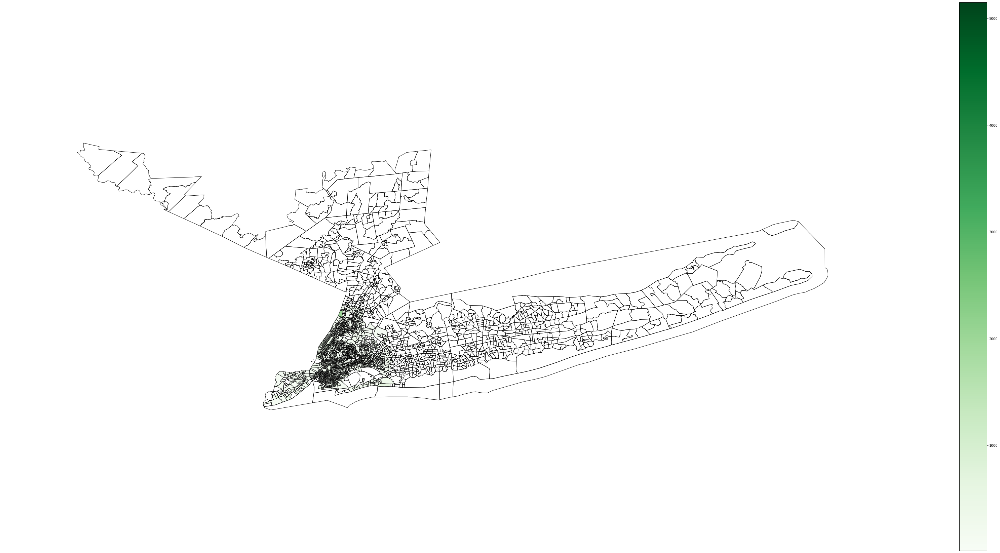

In [17]:
gplt.choropleth(NY_Tracts_Agg, hue="price", cmap="Greens", figsize=(60,30), legend=True)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
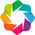

C:\Users\ImDav\anaconda3\envs\Geopy\lib\site-packages\geoviews\operation\projection.py:79: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  polys = [g for g in geom if g.area > 1e-15]


:Polygons   [Longitude,Latitude]   (price,GEOID)

In [18]:
import geoviews
geoviews.extension("bokeh")

choropleth = geoviews.Polygons(data=NY_Tracts_Agg, vdims=["price","GEOID"])

choropleth.opts(height=600, width=900, title="NYC Airbnb Price",
                tools=["hover"], cmap="Greens", colorbar=True, colorbar_position="bottom")

In [19]:
import statistics

# Calculating the mean and standard deviation
mean_price = statistics.mean(NY_Tracts_Agg['price'].dropna())
stdev = statistics.stdev(NY_Tracts_Agg['price'].dropna())

print("The mean Airbnb price is: % s " % (round(mean_price, 2)))
print("The standard deviation of Airbnb prices is: % s " % (round(stdev, 2)))

# Droping records that are more than 1 standard deviation from the mean
NY_Tracts_Agg_filtered = NY_Tracts_Agg[NY_Tracts_Agg['price'] < mean_price+stdev]

choropleth = geoviews.Polygons(data=NY_Tracts_Agg_filtered, vdims=["price","GEOID"])

choropleth.opts(height=600, width=900, title="NYC Airbnb Price",
                tools=["hover"], cmap="Greens", colorbar=True, colorbar_position="bottom")

The mean Airbnb price is: 154.64 
The standard deviation of Airbnb prices is: 190.02 


:Polygons   [Longitude,Latitude]   (price,GEOID)